In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import folium

Here we obtained data for our analysis titled NYC Crime from https://www.kaggle.com/ajkarella/nyc-crime-stats.

In [3]:
df= pd.read_csv('NYC_crime.csv', na_values='-')

# Data Cleaning

In [4]:
del df['Unnamed: 0']

We found a column called 'Unnamed: 0' which we believe should be deleted because the column is empty and there is no explanation for what this column is for.

In [5]:
df= df.dropna()

In [6]:
df

,arrest_key,arrest_date,pd_desc,ofns_desc,law_code,law_cat_cd,age_group,perp_sex,perp_race,latitude,longitude,arrest_boro,arrest_precinct,jurisdiction_code,:@computed_region_f5dn_yrer,:@computed_region_yeji_bk3q,:@computed_region_92fq_4b7q,:@computed_region_sbqj_enih
0,192799737,2019-01-26,SEXUAL ABUSE,SEX CRIMES,PL 1306503,F,45-64,M,BLACK,40.800694,-73.941109,M,25,0.0,7.0,4.0,36.0,16.0
1,193260691,2019-02-06,CRIMINAL SALE OF A CONTROLLED SUBSTANCE,CONTROLLED SUBSTANCES OFFENSES,PL 2203400,F,25-44,M,UNKNOWN,40.757839,-73.991212,M,14,0.0,12.0,4.0,10.0,8.0
2,149117452,2016-01-06,RAPE 3,RAPE,PL 1302503,F,25-44,M,BLACK,40.648650,-73.950336,K,67,0.0,61.0,2.0,11.0,40.0
3,190049060,2018-11-15,RAPE 1,RAPE,PL 1303501,F,25-44,M,BLACK,40.674583,-73.930222,K,77,0.0,16.0,2.0,49.0,49.0
4,24288194,2006-09-13,"TRESPASS 3, CRIMINAL",CRIMINAL TRESPASS,PL 140100E,M,45-64,M,BLACK,40.671254,-73.926714,K,77,2.0,16.0,2.0,49.0,49.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3881984,24592084,2006-10-01,"LARCENY,GRAND FROM OPEN AREAS,UNCLASSIFIED",GRAND LARCENY,PL 1553001,F,<18,M,BLACK,40.676655,-73.916466,K,73,0.0,69.0,2.0,17.0,52.0
3881985,24028282,2006-08-25,"MARIJUANA, SALE 4 & 5",DANGEROUS DRUGS,PL 2214000,M,<18,M,WHITE,40.625264,-73.998697,K,62,0.0,10.0,2.0,7.0,41.0
3881986,24036787,2006-08-26,"PUBLIC ADMINISTATION,UNCLASS MISDEMEAN 4",OFFENSES AGAINST PUBLIC ADMINISTRATION,PL 1950500,M,18-24,M,BLACK,40.801304,-73.936106,M,25,0.0,7.0,4.0,35.0,16.0
3881987,24028407,2006-08-25,"TRAFFIC,UNCLASSIFIED MISDEMEANOR",VEHICLE AND TRAFFIC LAWS,VTL05110E2,F,25-44,M,BLACK,40.675505,-73.899692,K,75,0.0,45.0,2.0,37.0,47.0


In [7]:
Q1=df.quantile(0.25)
Q3=df.quantile(0.75)
IQR = Q3 - Q1

Checking for outliers with IQR

In [8]:
df0 = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df0.shape

C:\Users\willi\AppData\Local\Temp\ipykernel_21812\4273004412.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  df0 = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]


(3030685, 18)

After searching for outliers using IQR, it can be seen that our data is now reduced to only around 3 million from the initial 3.8 million, meaning there are about 800 thousand data points that are outliers.

In [9]:
df0['arrest_date'] = df0['arrest_date']=pd.to_datetime(df0['arrest_date'])
df0['law_cat_cd'] = df0['law_cat_cd'].map({'F':'Felony', 'M':'Misdemeanor','V':'Violation','I':'Infractions'})
df0['arrest_boro'] = df0['arrest_boro'].map({'M':'Manhattan', 'K':'Brooklyn','Q':'Queens','B':'Bronx', 'S': 'Staten Island'})


C:\Users\willi\AppData\Local\Temp\ipykernel_21812\3707342360.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df0['arrest_date'] = df0['arrest_date']=pd.to_datetime(df0['arrest_date'])
C:\Users\willi\AppData\Local\Temp\ipykernel_21812\3707342360.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df0['law_cat_cd'] = df0['law_cat_cd'].map({'F':'Felony', 'M':'Misdemeanor','V':'Violation','I':'Infractions'})
C:\Users\willi\AppData\Local\Temp\ipykernel_21812\3707342360.py:3: SettingWithCopyWarning: 
A value 

To make it easier, I changed some column names here with names that correspond to what is already listed on Kaggle and from the results of internet searches as well.

In [10]:
df0 = df0.rename(columns={':@computed_region_f5dn_yrer' : 'Community District'})

In [11]:
del df0[':@computed_region_sbqj_enih']
del df0[':@computed_region_92fq_4b7q']
del df0[':@computed_region_yeji_bk3q']

3 columns is also deleted as it will not be used in the analysis later.

# Data Viewing

### Offense Type and Level Distribution

In [12]:
df1=df0['ofns_desc'].value_counts()

In [13]:
df1

DANGEROUS DRUGS                    723603
ASSAULT 3 & RELATED OFFENSES       323586
PETIT LARCENY                      144911
VEHICLE AND TRAFFIC LAWS           130066
FELONY ASSAULT                     129576
                                    ...  
UNDER THE INFLUENCE, DRUGS              3
KIDNAPPING, COERCION                    2
NYS LAWS-UNCLASSIFIED VIOLATION         1
GAMBLING OFFENSES                       1
OTHER PUBLIC SAFETY OFFENSES            1
Name: ofns_desc, Length: 96, dtype: int64

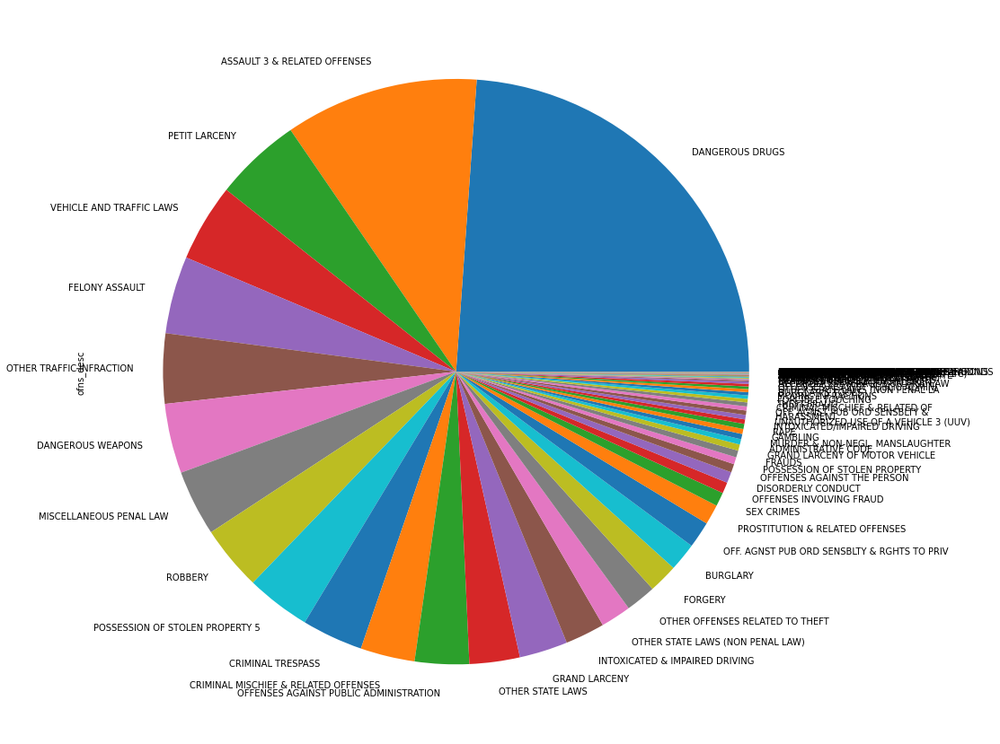

In [14]:
plot = df1.plot.pie(y='Offense Type', figsize=(15,15))

As can be seen, the most common type of crime committed in NYC is drug trafficking, followed by acts of violence and petit larceny, also known as theft.

In [15]:
df2=df0['law_cat_cd'].value_counts()

In [16]:
df2

Misdemeanor    2009158
Felony          891754
Violation       114103
Infractions      15670
Name: law_cat_cd, dtype: int64

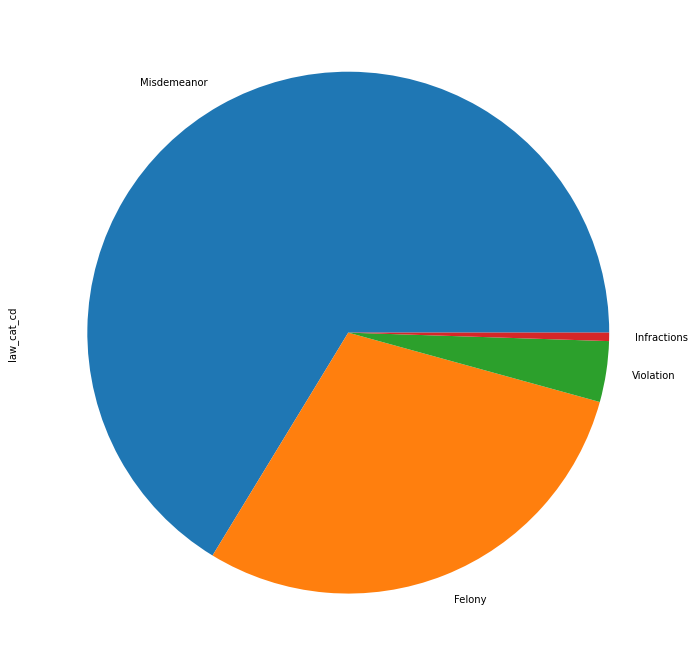

In [17]:
plot = df2.plot.pie(y='Offense Level', figsize=(12,12))

The most frequently committed crime level is misdemeanor, which means minor-level crime, followed by felony, which means serious-level crime.

### Age Distribution

<AxesSubplot:xlabel='age_group', ylabel='count'>

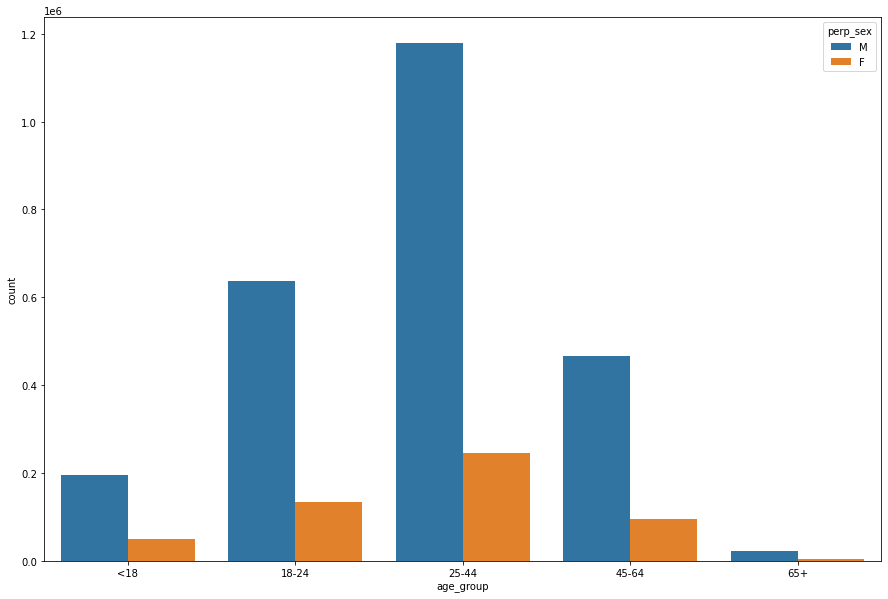

In [18]:
plt.figure(figsize=(15,10))
sns.countplot(x=df0['age_group'],order=['<18','18-24','25-44','45-64','65+'], hue=df0['perp_sex'])

Based on age, crimes in NYC are most commonly committed by males aged 25-44, followed by males aged 18-24 and males aged 45-64.

### Race Distribution

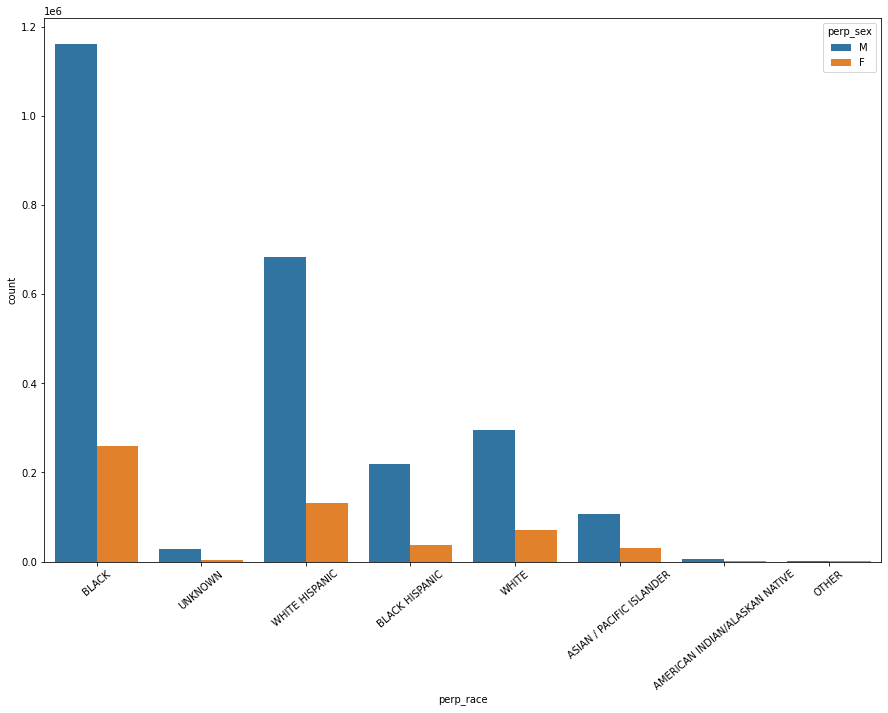

In [19]:
plt.figure(figsize=(15,10))
sns.countplot(x=df0['perp_race'],hue=df0['perp_sex'])
_ = plt.xticks(rotation=40)

In terms of racial distribution, crimes in NYC are most frequently committed by black males, followed by Hispanic white males or what can be considered Latin males, and then followed by white males.

In [20]:
dfblack = df0[df0['perp_race']=='BLACK']

### RACE ANALYSIS (Highest Only)

Here, we want to see what the most common crime committed by the race with the highest number of crimes, which is the black race.

In [21]:
dfo=dfblack['ofns_desc'].value_counts()

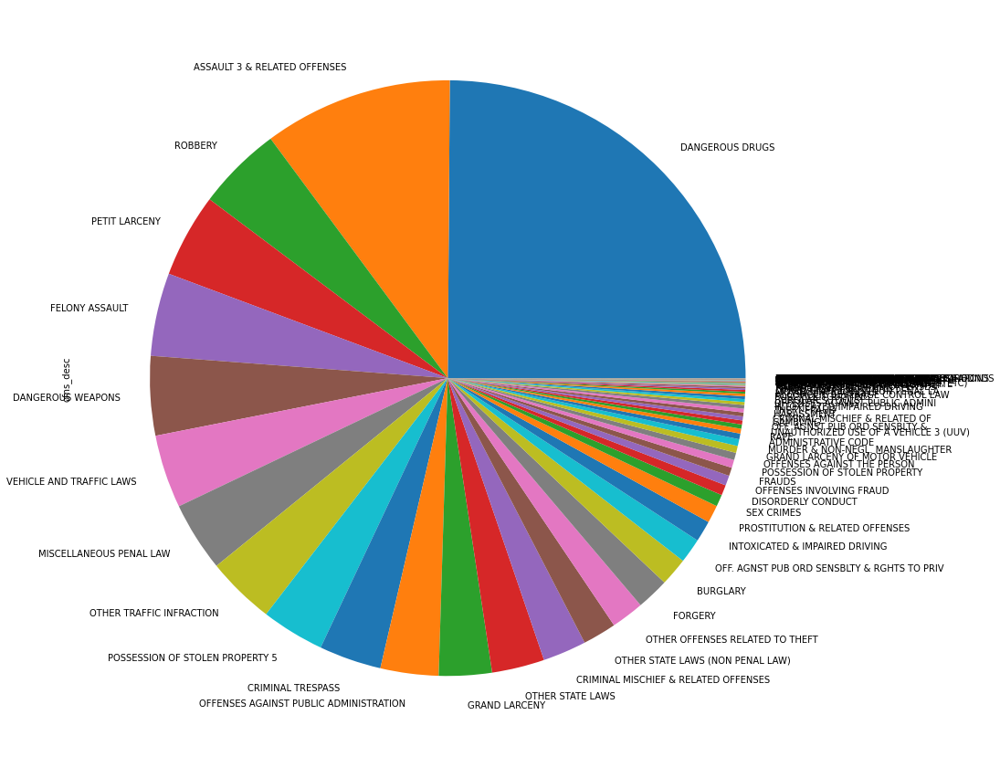

In [22]:
plot = dfo.plot.pie(y='ofns_desc', figsize=(15,15))

The most common crime committed is drug trafficking, followed by acts of violence and theft, which means these three crimes are indeed the ones most frequently committed in NYC regardless of the race of the perpetrators.

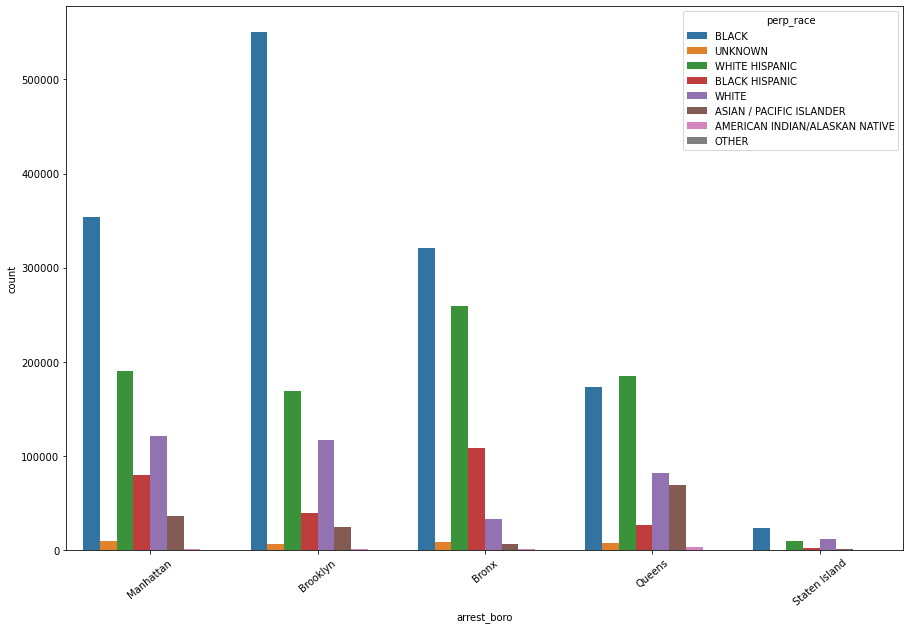

In [23]:
plt.figure(figsize=(15,10))
sns.countplot(x=df0['arrest_boro'],hue=df0['perp_race'])
_ = plt.xticks(rotation=40)

If we consider each borough, black males who commit crimes most frequently are in Brooklyn, followed by Manhattan and the Bronx.

# Data Analysis

Our objective is to determine the safest areas in NYC and the safest districts within those areas. Specifically, we aim to identify which district numbers are safest to visit, as our focus is on creating a safety guide for New York City. Therefore, we will start by analyzing the different areas in NYC. Our approach involves examining the crime rates in each area over the years to determine which are the most severe and which are the least severe (meaning those with the fewest incidents compared to other areas), and we'll do the same for district analysis.

### Crime Distribution From Year to Year (Borough)

In [24]:
df0['Month'] = pd.DatetimeIndex(df0['arrest_date']).month

In [25]:
df0['Year'] = pd.DatetimeIndex(df0['arrest_date']).year

In [26]:
df3=df0[['arrest_boro','Year']].groupby(['Year','arrest_boro']).agg({'arrest_boro':'count'})

In [27]:
df3

arrest_boro
Year arrest_boro               
2006 Bronx                53538
     Brooklyn             67387
     Manhattan            59554
     Queens               40871
     Staten Island         3555
...                         ...
2019 Bronx                32288
     Brooklyn             39102
     Manhattan            32833
     Queens               25494
     Staten Island         2512

[70 rows x 1 columns]

<AxesSubplot:xlabel='Year'>

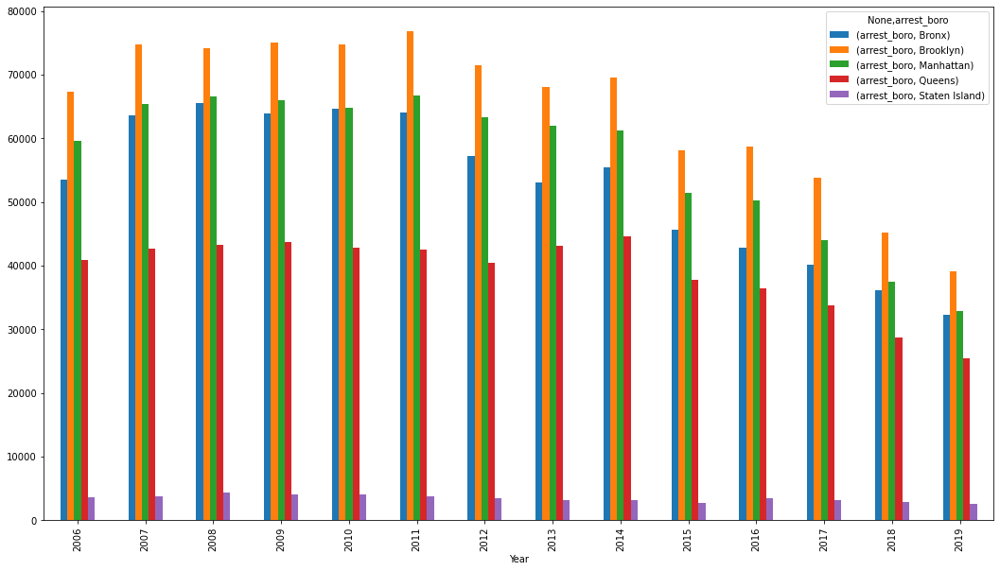

In [28]:
df3.unstack().plot(kind='bar', figsize=(18,10))

Over the years, there is a decrease in the number of criminal incidents across all boroughs. However, Brooklyn, Bronx, and Manhattan notably show significant declines. Despite this, these three boroughs still have the highest number of criminal incidents in absolute terms.

Below is the detailed plot of criminal incidents per borough over the years.

In [29]:
listbron=[]
listbrok=[]
listman=[]
listque=[]
liststa=[]

for i in range (2006,2020):
        x= len(df0[(df0['Year']==i)&(df0['arrest_boro']=="Bronx")])
        y= len(df0[(df0['Year']==i)])
        listbron.append(x/y)
        
for i in range (2006,2020):
        x= len(df0[(df0['Year']==i)&(df0['arrest_boro']=="Brooklyn")])
        y= len(df0[(df0['Year']==i)])
        listbrok.append(x/y)        
        
for i in range (2006,2020):
        x= len(df0[(df0['Year']==i)&(df0['arrest_boro']=="Manhattan")])
        y= len(df0[(df0['Year']==i)])
        listman.append(x/y)        
        
for i in range (2006,2020):
        x= len(df0[(df0['Year']==i)&(df0['arrest_boro']=="Queens")])
        y= len(df0[(df0['Year']==i)])
        listque.append(x/y)      
        
for i in range (2006,2020):
        x= len(df0[(df0['Year']==i)&(df0['arrest_boro']=="Staten Island")])
        y= len(df0[(df0['Year']==i)])
        liststa.append(x/y)      

In [30]:
df4 = pd.DataFrame({'Month': liststa}, index=['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017',
      '2018','2019'])

<AxesSubplot:title={'center':'Staten Island Proportion'}>

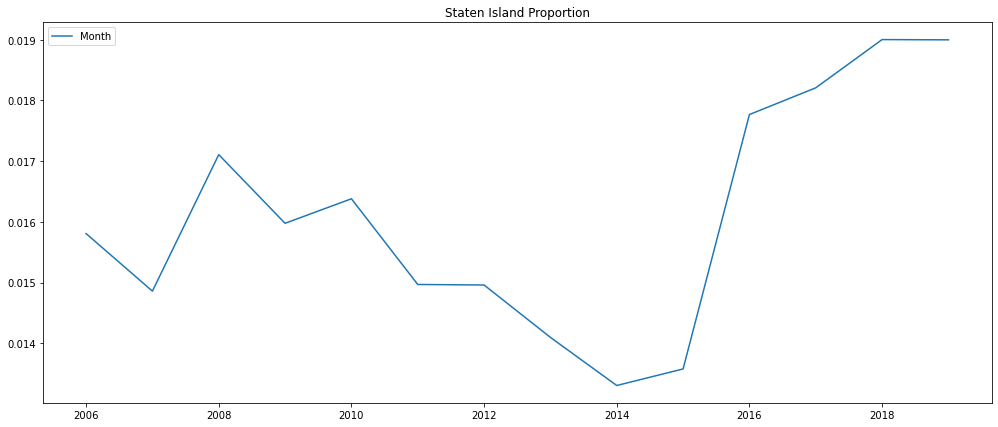

In [31]:
df4.plot(title='Staten Island Proportion', figsize=(17,7))

In [32]:
df4 = pd.DataFrame({'Month': listbrok}, index=['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017',
      '2018','2019'])

<AxesSubplot:title={'center':'Brooklyn Proportion'}>

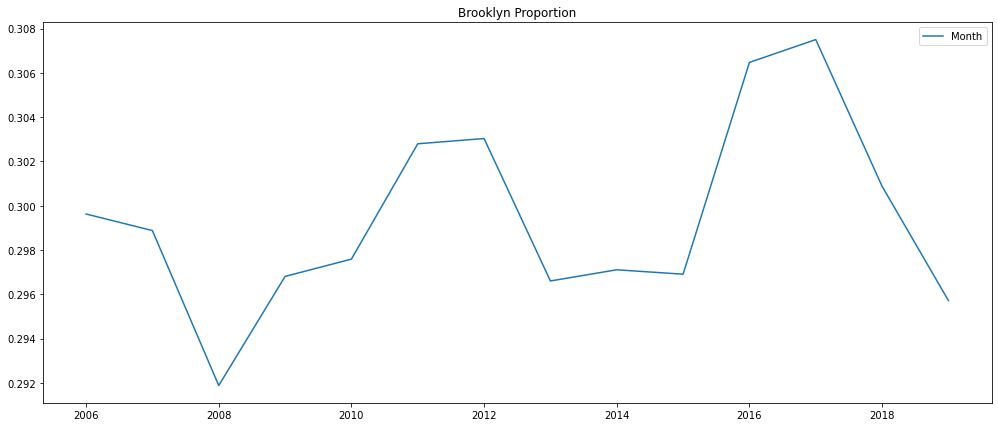

In [33]:
df4.plot(title='Brooklyn Proportion', figsize=(17,7)) 

In [34]:
df4 = pd.DataFrame({'Month': listbron}, index=['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017',
      '2018','2019'])

<AxesSubplot:title={'center':'Bronx Proportion'}>

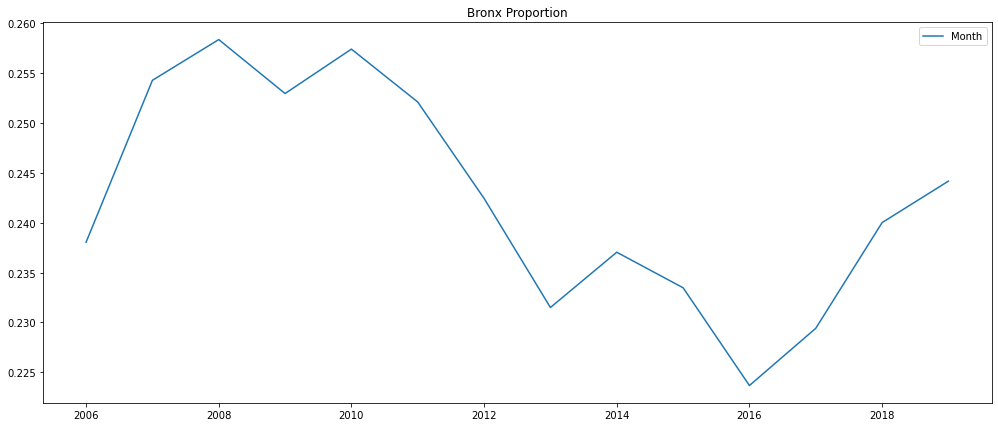

In [35]:
df4.plot(title='Bronx Proportion', figsize=(17,7)) 

In [36]:
df4 = pd.DataFrame({'Month': listman}, index=['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017',
      '2018','2019'])

<AxesSubplot:title={'center':'Manhattan Proportion'}>

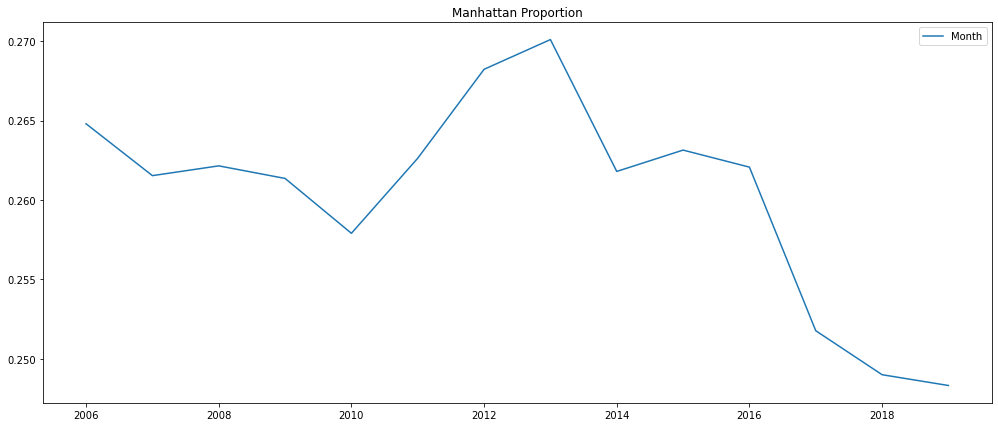

In [37]:
df4.plot(title='Manhattan Proportion', figsize=(17,7)) 

In [38]:
df4 = pd.DataFrame({'Month': listque}, index=['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017',
      '2018','2019'])

<AxesSubplot:title={'center':'Queens Proportion'}>

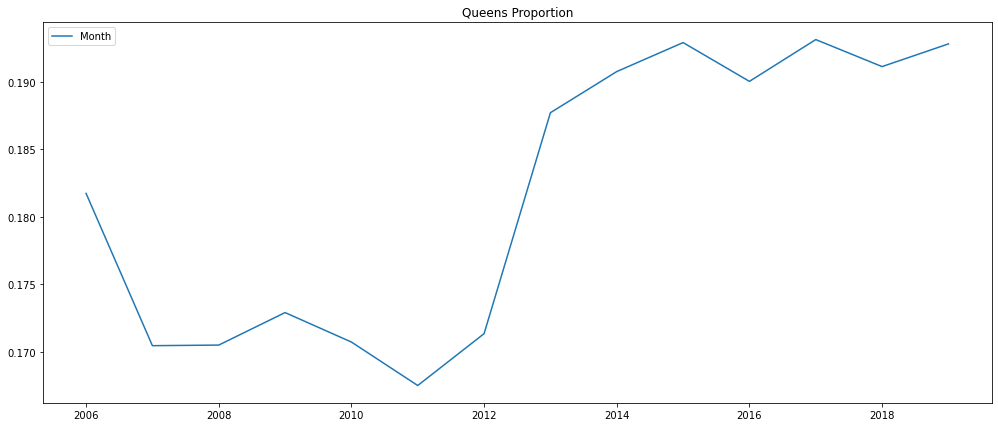

In [39]:
df4.plot(title='Queens Proportion', figsize=(17,7)) 

As mentioned earlier, all boroughs have experienced a recent decline in crime rates. However, Brooklyn still remains at a significantly high level, indicating that if you plan to visit NYC, it's advisable to avoid staying in Brooklyn if possible due to its high crime rate. On the other hand, Staten Island has a remarkably low crime rate, with a significant difference compared to other boroughs, making it an ideal choice for visiting and settling in NYC. As for the other three boroughs, while their crime rates are not as high as Brooklyn's, they still remain relatively high, with crime numbers in the tens of thousands, unlike Staten Island, where the crime rate doesn't even reach 5,000.

### Crime Mapping

In [40]:
map_1 = folium.Map(location=[40.7128,-73.9060 ],tiles='OpenStreetMap',
 zoom_start=11)
for each in df0[:10000].iterrows():
    if each[1]['law_cat_cd'] == 'Misdemeanor':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='navy',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_1)
    elif each[1]['law_cat_cd'] == 'Felony':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='orange',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_1)
    elif each[1]['law_cat_cd'] == 'Violation':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='green',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_1)
    elif each[1]['law_cat_cd'] == 'Infractions':
        folium.CircleMarker([each[1]['latitude'],each[1]['longitude']],
                            radius=2,
                            color='red',
                            tooltip=str(each[1]['law_cat_cd']),
                            fill_opacity=0.4,
                            opacity=0.4
                            ).add_to(map_1)
map_1

Here we use Folium to match the crimes that occur with the actual world map using latitude and longitude columns, thus creating visualizations as seen above. From the map alone (here we only use a sample of 10,000 crimes, it could be more, but we believe the results will remain the same, and if the sample size is larger, we fear it may slow down our Jupyter work later), it can be seen that in Staten Island, the crime rate is very low compared to other areas which are densely populated with dots.

### Community District Analysis


After analyzing based on borough, we want to analyze based on community district. In cases where you have to stay in, for example, Brooklyn (the borough with the highest number of crimes), then we will find the safest community district number (the number can be seen by zooming in on the data mapping above) for you.

In [41]:
dfrec = df0[(df0['Year']==2015) | (df0['Year']==2016) | (df0['Year']==2017) | (df0['Year']==2018) |(df0['Year']==2019)]

This time, we will only use data from the last 5 years because we want to make decisions based on the most relevant data, especially after the borough analysis earlier indicated that the number has been decreasing over the years, prompting us to take only the most recent data for more accurate information.

In [42]:
dfman = dfrec[(dfrec['arrest_boro']=='Manhattan')]

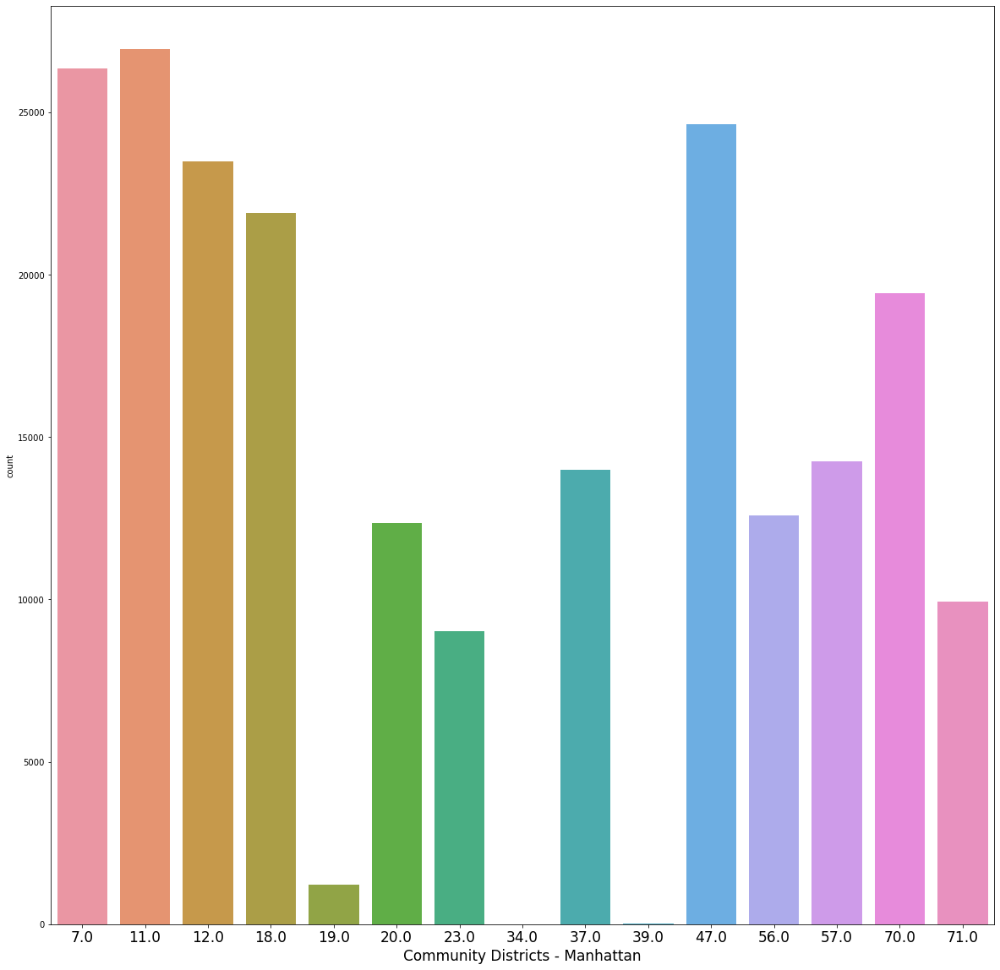

In [43]:
plt.figure(figsize=(20,20))
sns.countplot(x=dfman['Community District'])
_ = plt.xlabel('Community Districts - Manhattan',fontsize=17)
_ = plt.xticks(fontsize=17)

In Manhattan, the districts with the highest number of criminal cases are 7, 11, and 47. Therefore, it is not recommended to live or go to these districts. On the contrary, the safest districts in Manhattan are 19, 34, and 39. Therefore, it is recommended to choose these districts if you want to visit or live in Manhattan. As for other districts, they can be considered moderate, meaning they are not safe but not extremely dangerous either.

In [44]:
dfbr = dfrec[(dfrec['arrest_boro']=='Bronx')]

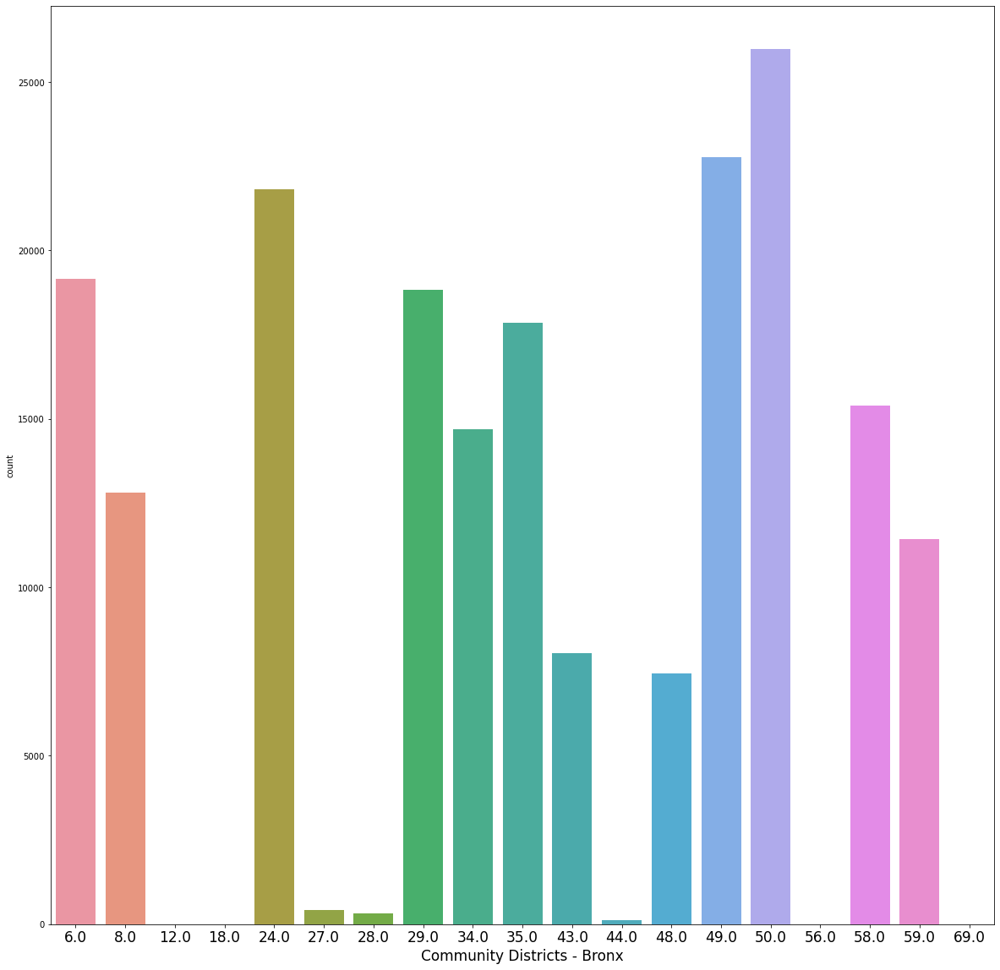

In [45]:
plt.figure(figsize=(20,20))
sns.countplot(x=dfbr['Community District'])
_ = plt.xlabel('Community Districts - Bronx',fontsize=17)
_ = plt.xticks(fontsize=17)

In the Bronx, the districts with the highest number of criminal cases are 24, 49, and 50. Therefore, it is not recommended to live or go to these districts. Conversely, the safest districts in the Bronx are 12, 18, 56, and 69. Therefore, it is recommended to choose these districts if you want to visit or live in the Bronx. As for other districts, they can be considered moderate, meaning they are not safe but not extremely dangerous either.

In [46]:
dfqu = dfrec[(dfrec['arrest_boro']=='Queens')]

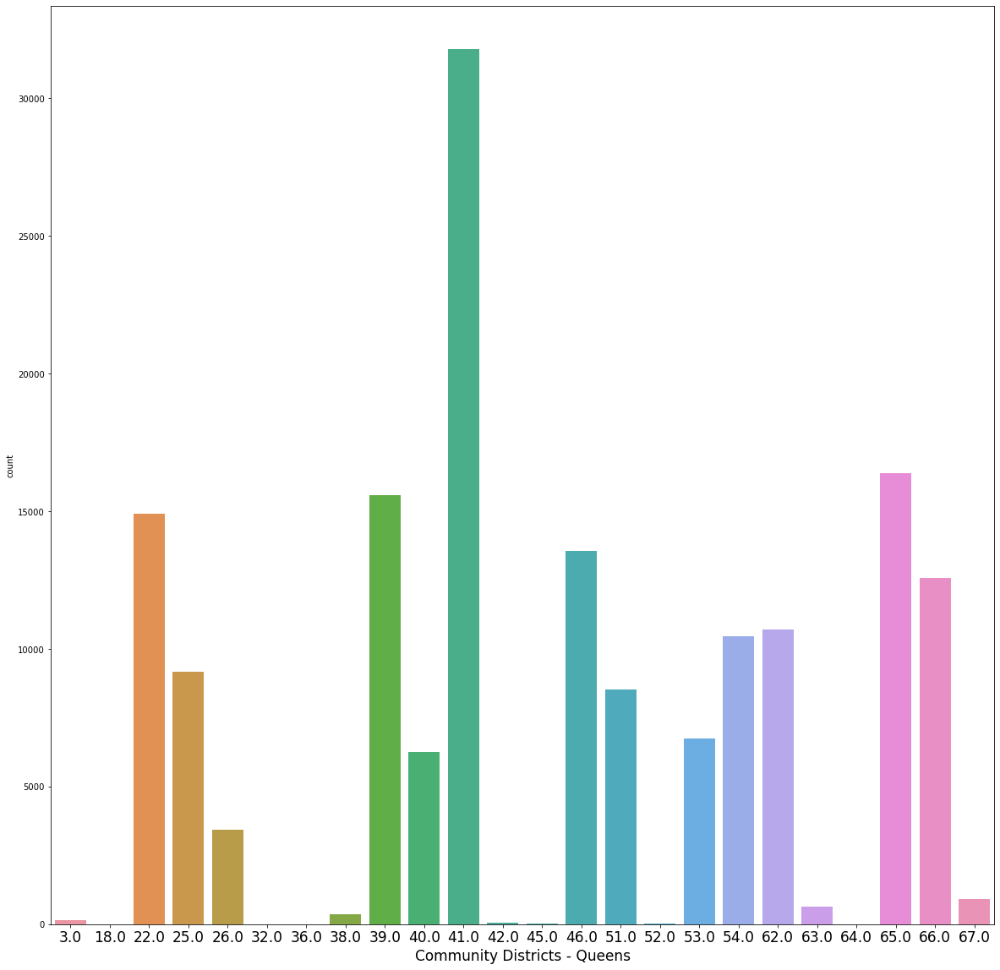

In [47]:
plt.figure(figsize=(20,20))
sns.countplot(x=dfqu['Community District'])
_ = plt.xlabel('Community Districts - Queens',fontsize=17)
_ = plt.xticks(fontsize=17)

In Queens, the district with the highest number of criminal cases is 41. Therefore, it is not recommended to live or go to that district. Conversely, the safest districts in Queens are 18, 32, 36, and 64. Therefore, it is recommended to choose these districts if you want to visit or live in Queens. Particularly for Queens, this area is somewhat uneven, as there are many safe areas, but if there is an area with a high crime rate, it will be significantly high, as seen in district number 41. In fact, there are more than 4 safe districts, as there are around 10 districts with low crime rates, but we only choose the top 4.

In [48]:
dfbro = dfrec[(dfrec['arrest_boro']=='Brooklyn')]

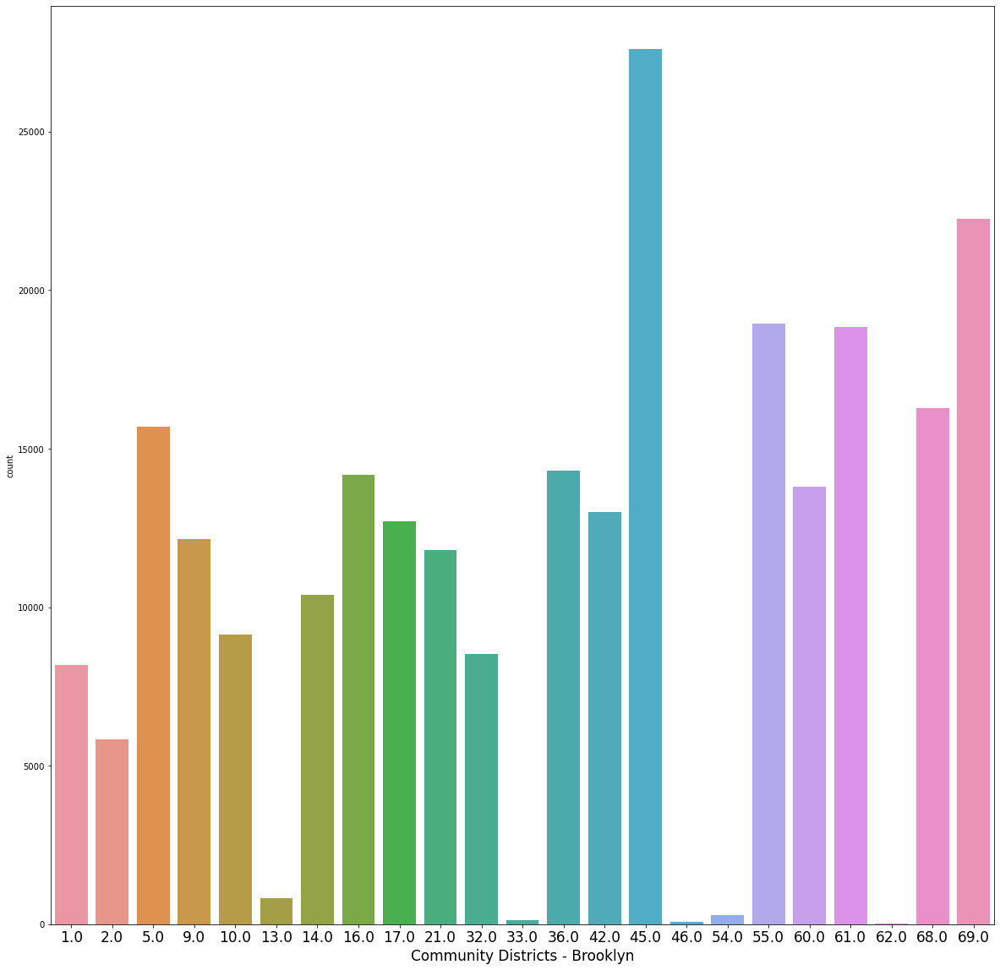

In [49]:
plt.figure(figsize=(20,20))
sns.countplot(x=dfbro['Community District'])
_ = plt.xlabel('Community Districts - Brooklyn',fontsize=17)
_ = plt.xticks(fontsize=17)

In Brooklyn, the districts with the highest number of criminal cases are 45 and 69. Therefore, it is not recommended to live or go to these districts. Conversely, the safest districts in Brooklyn are 33, 46, and 62. Therefore, it is recommended to choose these districts if you want to visit or live in Brooklyn. Especially for Brooklyn, it can be said that almost all areas are dangerous because the average crime rates are high. If we look at the graph, only 4 to 5 areas are low, while the rest are high, with even more than 10 districts having over 10,000 criminal cases, in contrast to Queens where over 10 districts have low crime rates.

In [50]:
dfst = dfrec[(dfrec['arrest_boro']=='Staten Island')]

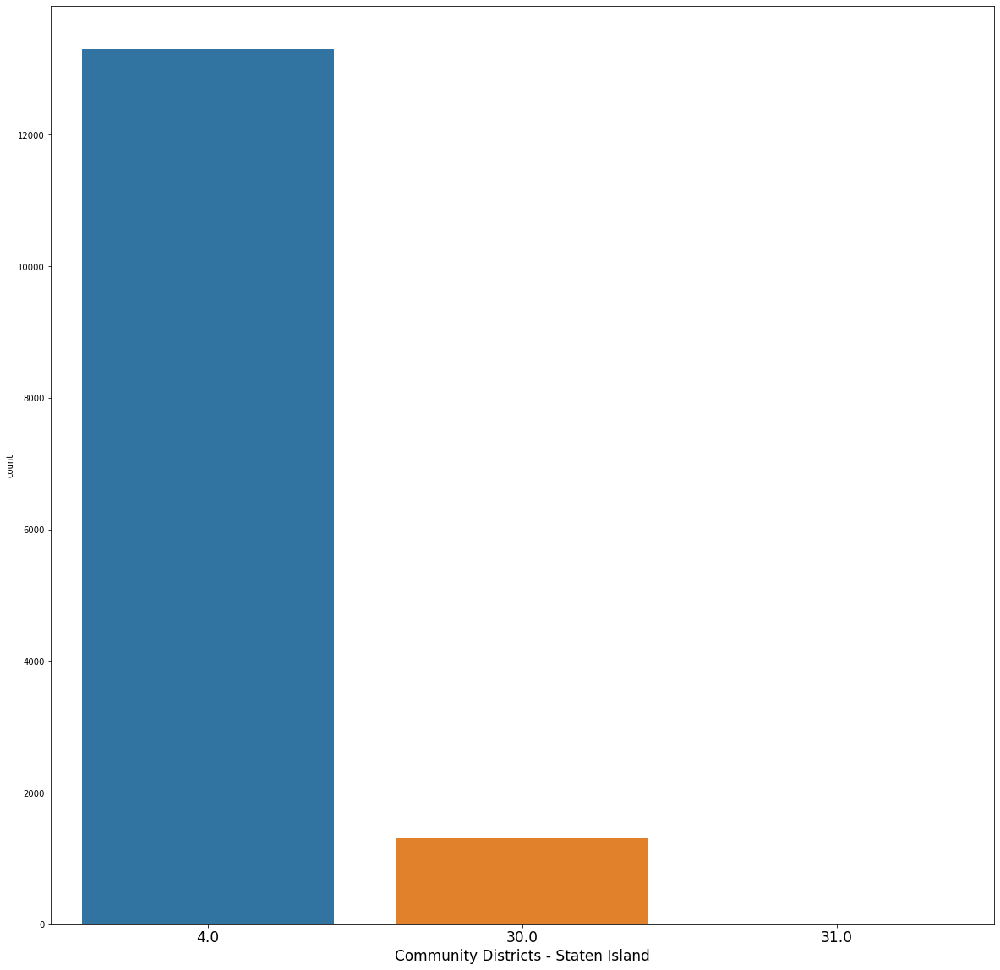

In [51]:
plt.figure(figsize=(20,20))
sns.countplot(x=dfst['Community District'])
_ = plt.xlabel('Community Districts - Staten Island',fontsize=17)
_ = plt.xticks(fontsize=17)

In Staten Island, the district with the highest number of criminal cases is 4. Therefore, it is not recommended to live or go to that district. Conversely, the safest district in Staten Island is 31. Therefore, it is recommended to choose this district if you want to visit or live in Staten Island. For Staten Island, it could also be considered somewhat uneven, but this is also because of the very few districts compared to other boroughs.

# Kesimpulan

If you are planning to visit or live in New York City, here is the safety guide we can provide:

If you can choose which borough to live in, here are the safest boroughs to live in or visit (from safest to least safe):

    Staten Island (very safe)
    Queens (second safest but still relatively vulnerable)
    Bronx (vulnerable)
    Manhattan (vulnerable)
    Brooklyn (very unsafe)

However, if you cannot choose the borough you live in, here are the safest districts within each borough:

    Staten Island
    Safest: District 31
    Unsafe: District 4

    Queens
    Safest: Districts 18, 32, 36, and 64
    Unsafe: District 41

    Bronx
    Safest: Districts 12, 18, 56, and 69
    Unsafe: Districts 24, 49, and 50

    Manhattan
    Safest: Districts 19, 34, and 39
    Unsafe: Districts 7, 11, and 47

    Brooklyn
    Safest: Districts 33, 46, and 62
    Unsafe: Districts 45 and 69

That concludes our safety guide for NYC.